In [ ]:
import sys
from pathlib import Path
# Make the repo root importable regardless of CWD or machine: walk up from the
# working dir until we hit a repo marker, then put that dir on sys.path.
_start = Path.cwd()
_root = next((p for p in (_start, *_start.parents)
              if (p / ".git").exists() or (p / "setup.py").exists()), _start)
if str(_root) not in sys.path:
    sys.path.insert(0, str(_root))

In [1]:
import numpy as np
import scanpy as sc
# import matplotlib.pyplot as plt
import scvi
from pathlib import Path
import os
import random



/global/home/users/fosterangus/.conda/envs/scvi/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from metab_processing.metab_travlr_config import PROJECT_DATA_DIR, DATA_DIR as METAB_DATA_DIR

# Consts
XENIUM_DATA_DIR = PROJECT_DATA_DIR
N_LATENT = 45
DEVICE = 'gpu'
N_DEVICES = 1
# DEVICE = 'cpu'
# N_DEVICES = 'auto'
SCVI_LATENT_KEY = "X_scVI"

In [3]:
def run_scvi_params(adata_path, model_dir, save_adata_dir, overwrite_model=True):
    print(f'running on {adata_path}')
    adata = sc.read_h5ad(adata_path)
    print('adata laoded')
    scvi.model.SCVI.setup_anndata(
    adata,
    # batch_key="sample",
    )
    model = scvi.model.SCVI(adata, n_latent=N_LATENT)
    print('starting training')


    os.environ["MASTER_ADDR"] = "localhost"
    # Generate a fresh port for EVERY dataset in the loop
    os.environ["MASTER_PORT"] = str(random.randint(20000, 60000))

    
    model.train(accelerator=DEVICE, devices=N_DEVICES)
    print('training done')


    model.save(model_dir, overwrite=overwrite_model)
    latent = model.get_latent_representation()
    adata.obsm[SCVI_LATENT_KEY] = latent

    adata.write_h5ad(save_adata_dir)

    return adata


def run_scvi(xen_d_set_name, overwrite_model=True):
    return run_scvi_params(
        f'{XENIUM_DATA_DIR}/{xen_d_set_name}/adata.h5ad',
        f'{XENIUM_DATA_DIR}/{xen_d_set_name}/scvi_model',
        f'{XENIUM_DATA_DIR}/{xen_d_set_name}/adata.h5ad',
        overwrite_model=overwrite_model
        )

In [4]:
def get_list_of_unprocessed_dirs():
    to_process = []
    xenium_data_dir = Path(XENIUM_DATA_DIR)
    for d_set_dir in xenium_data_dir.iterdir():
        if d_set_dir.is_dir():
            scvi_model_dir = d_set_dir / 'scvi_model'
            if not scvi_model_dir.is_dir():
                to_process.append(d_set_dir.name)
    print(f'Will process: {to_process}')
    return to_process

In [5]:
to_train = get_list_of_unprocessed_dirs()

for d_set in to_train:    
    print(f'\nStarting {d_set}\n')
    tmp = run_scvi(d_set)
    del tmp

Will process: []


In [6]:
resolutions = [2.5, 2, 1.5, 1, 0.75, 0.65, 0.5, 0.375, 0.25, 0.1, 0.05]
def res_label(res):
    return f'leiden_scVI_res_{res}'
res_labels = [res_label(res) for res in resolutions]

Starting /global/scratch/users/fosterangus/MetabTravLR/Data/Xenium/Human_Breast


Neighbors already exists
The Leiden clustering run for 'leiden_scVI_res_2.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_2' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.75' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.65' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.375' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.25' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.05' has already been made.
UMAP coordinates found under 'X_umap'.
Shape of coordinates: (699110, 2)


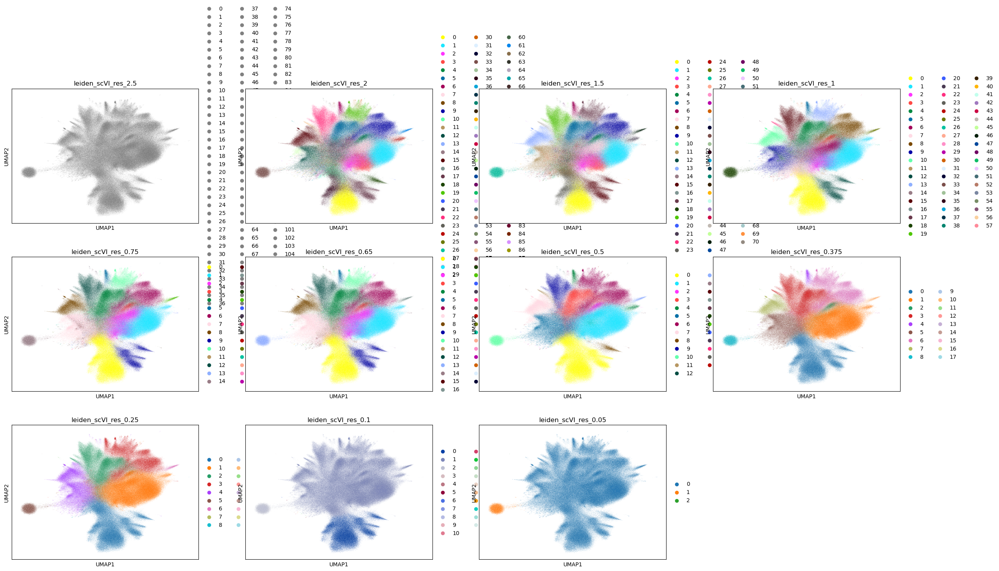

Starting /global/scratch/users/fosterangus/MetabTravLR/Data/Xenium/Human_Lung
Neighbors already exists
The Leiden clustering run for 'leiden_scVI_res_2.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_2' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.75' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.65' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.375' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.25' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.05' has already been made.
UMAP coordinates found under 'X_umap'.
Shape of coordinates: (278328, 

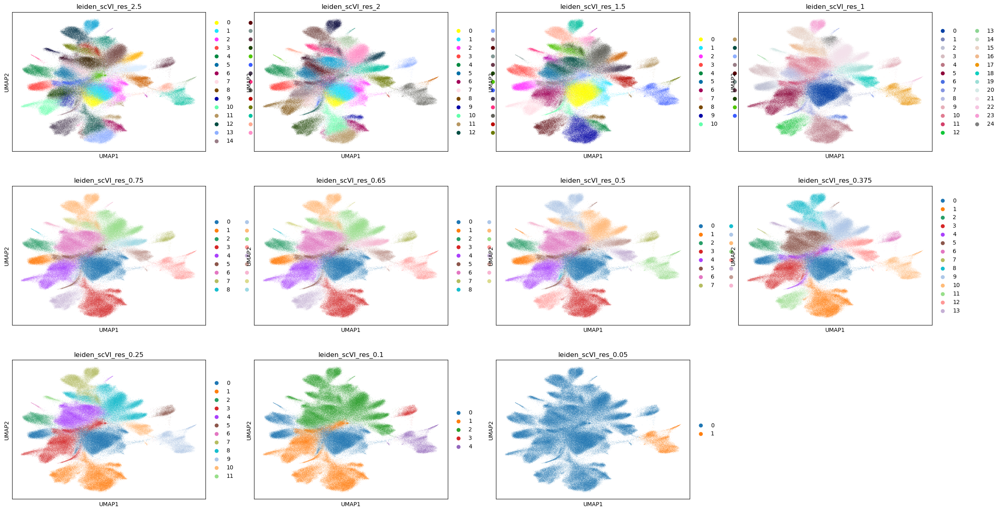

Starting /global/scratch/users/fosterangus/MetabTravLR/Data/Xenium/Human_Prostate_Adenocarcinoma
Neighbors already exists
The Leiden clustering run for 'leiden_scVI_res_2.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_2' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.75' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.65' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.375' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.25' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.05' has already been made.
UMAP coordinates found under 'X_umap'.
Shape of coo

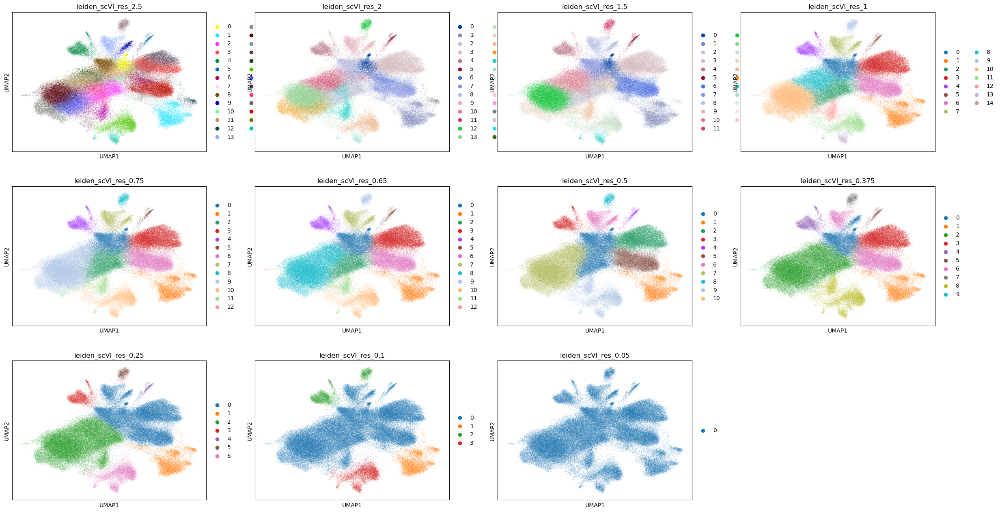

Starting /global/scratch/users/fosterangus/MetabTravLR/Data/Xenium/Human_Cervical_Cancer
Neighbors already exists
The Leiden clustering run for 'leiden_scVI_res_2.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_2' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.75' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.65' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.375' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.25' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.05' has already been made.
UMAP coordinates found under 'X_umap'.
Shape of coordinates

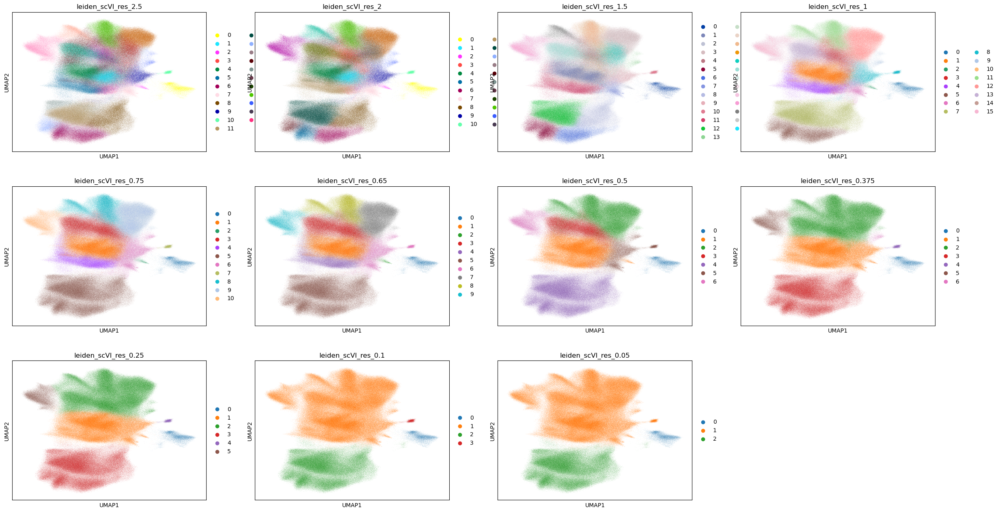

Starting /global/scratch/users/fosterangus/MetabTravLR/Data/Xenium/Primary_Dermal_Melanoma
Neighbors already exists
The Leiden clustering run for 'leiden_scVI_res_2.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_2' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.75' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.65' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.375' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.25' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.05' has already been made.
UMAP coordinates found under 'X_umap'.
Shape of coordinat

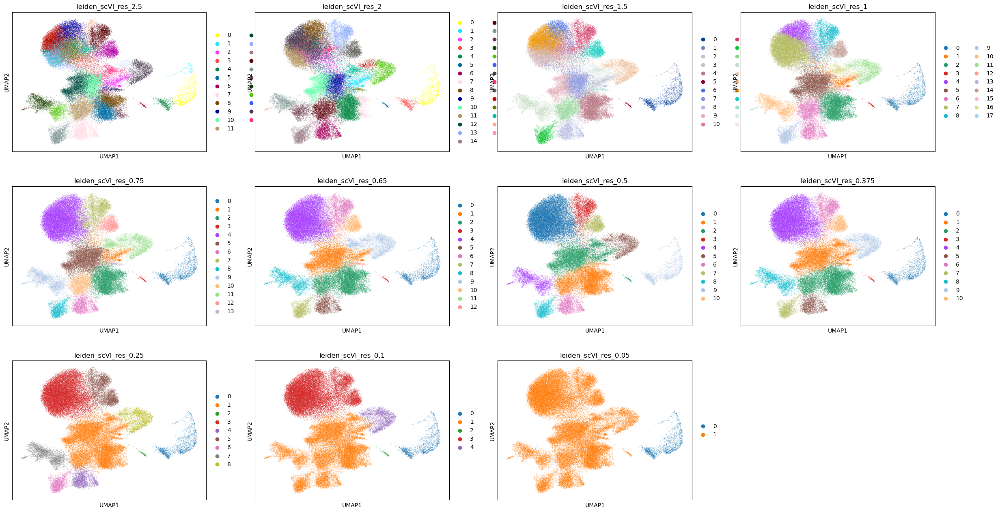

Starting /global/scratch/users/fosterangus/MetabTravLR/Data/Xenium/FFPE_Human_Ovarian_Cancer
Neighbors already exists
The Leiden clustering run for 'leiden_scVI_res_2.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_2' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.75' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.65' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.5' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.375' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.25' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.1' has already been made.
The Leiden clustering run for 'leiden_scVI_res_0.05' has already been made.
UMAP coordinates found under 'X_umap'.
Shape of coordin

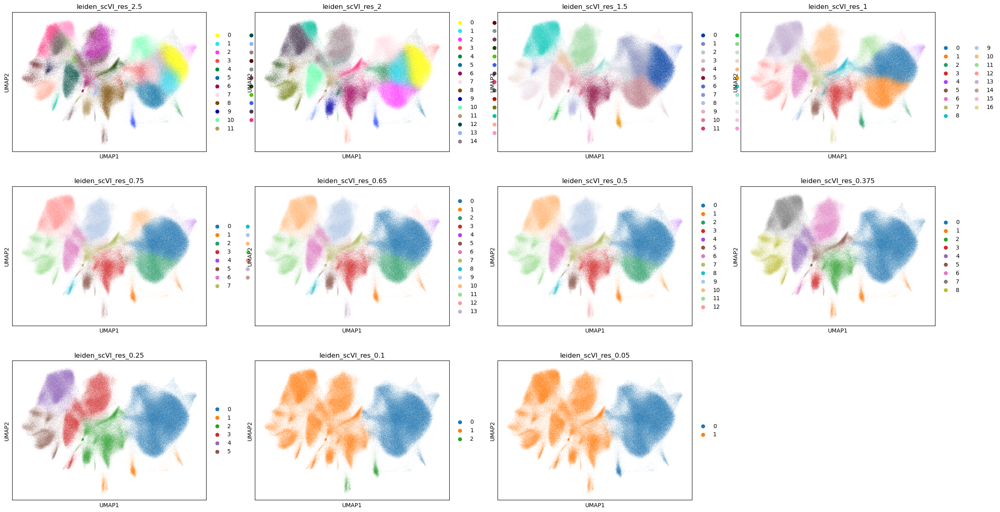

Starting /global/scratch/users/fosterangus/MetabTravLR/Data/Xenium/FF_Human_Ovarian_Adenocarcinoma
Neighbors already exists
Running clustering 'leiden_scVI_res_2.5'.
Running clustering 'leiden_scVI_res_2'.
Running clustering 'leiden_scVI_res_1.5'.
Running clustering 'leiden_scVI_res_1'.
Running clustering 'leiden_scVI_res_0.75'.
Running clustering 'leiden_scVI_res_0.65'.
The Leiden clustering run for 'leiden_scVI_res_0.5' has already been made.
Running clustering 'leiden_scVI_res_0.375'.
Running clustering 'leiden_scVI_res_0.25'.
Running clustering 'leiden_scVI_res_0.1'.
Running clustering 'leiden_scVI_res_0.05'.
UMAP coordinates found under 'X_umap'.
Shape of coordinates: (1157659, 2)


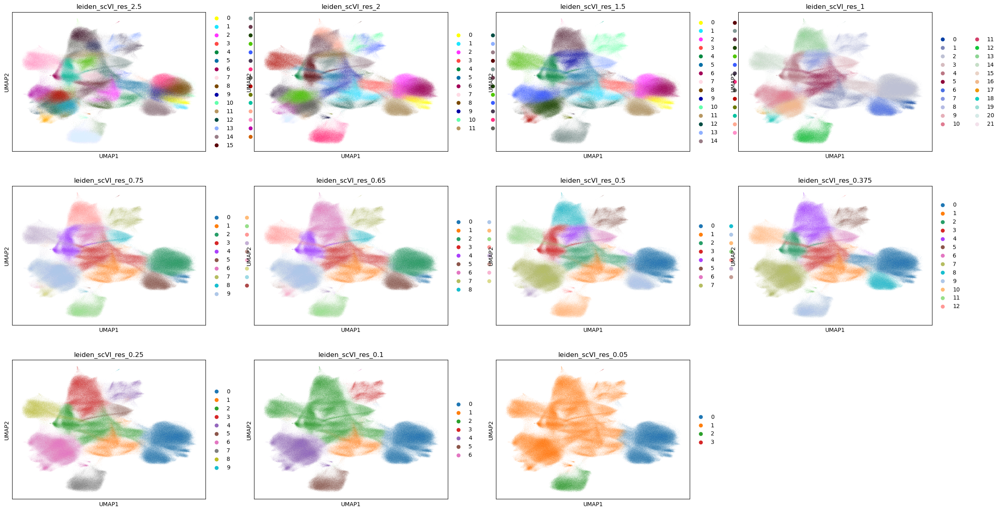

In [7]:
def add_umaps():
    xenium_data_dir = Path(XENIUM_DATA_DIR)
    for d_set_dir in xenium_data_dir.iterdir():
        adata_path = f'{XENIUM_DATA_DIR}/{d_set_dir.name}/adata.h5ad'
        print(f'Starting {d_set_dir}')
        adata = sc.read_h5ad(adata_path)
        add_umap(adata, adata_path=adata_path)
        adata.write_h5ad(adata_path)
        del adata

def add_umap(adata, adata_path=None):
    if not "neighbors" in adata.uns:
        print('neighbors start')
        sc.pp.neighbors(adata, use_rep="X_scVI")
    else:
        print('Neighbors already exists')

    for res in resolutions:
        
        leiden_key = res_label(res)
        if leiden_key in adata.obs:
            print(f"The Leiden clustering run for '{leiden_key}' has already been made.")
        else:
            print(f"Running clustering '{leiden_key}'.")
            sc.tl.leiden(adata, resolution=res, key_added=leiden_key, flavor="igraph")
            if adata.n_obs > 300000 and adata_path:
                adata.write_h5ad(adata_path)
    
    umap_key = 'X_umap' 

    if umap_key in adata.obsm:
        print(f"UMAP coordinates found under '{umap_key}'.")
        print(f"Shape of coordinates: {adata.obsm[umap_key].shape}")
    else:
        print(f"Running umap '{umap_key}'.")
        sc.tl.umap(adata)
    sc.pl.umap(adata, color=res_labels)

add_umaps()

In [8]:
adata

NameError: name 'adata' is not defined